In [17]:
#today, we will put together a lovely hovmoller raahhhhhhhhhhh
import os
import glob
import subprocess
import matplotlib.pyplot as plt
import pandas as pd
import math
from numpy import *
from pylab import *

import pyproj
import metpy.calc as mpcalc
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.crs as crs
from cartopy.geodesic import Geodesic
from cartopy.feature import NaturalEarthFeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import wrf
from wrf import (to_np, interplevel, geo_bounds, getvar, smooth2d, get_cartopy, cartopy_xlim,
                 cartopy_ylim, latlon_coords)
import shutil

# Download state and coastline data
states = NaturalEarthFeature(category="cultural", scale="50m",
                          facecolor="none", name="admin_1_states_provinces_shp")
from scipy.interpolate import RegularGridInterpolator
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
import matplotlib.ticker as mticker
from matplotlib.gridspec import GridSpec
from matplotlib.ticker import ScalarFormatter
from scipy.ndimage import gaussian_filter

import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
from netCDF4 import Dataset, num2date, date2num
from datetime import datetime

In [2]:
#Set some constants for later use
deltap     = 5000.        # vertical isobaric spacing
resol      = 0.5          # degrees
pref       = 100000.      # Pa
cv         = 717.         # J kg-1 K-1
cp         = 1004.7       # J kg-1 K-1
omega      = 7.292e-5     # Rotation rate s-1       
rd         = 287.04       # J kg-1 K-1
fo         = 1.0e-4       # s-1; assume constant Coriolis parameter (Eliassen 1962)
po         = 100000.      # standard pressure (Pa)
r_earth    = 6.3781e6     # meters (Earth Radius)
grav       = 9.80665      # m/s-2
d2r        = (np.pi)/180. # degrees to radians
rv         = 461.50

def find_nearest(a, val):
    return np.abs(a - val).argmin()

In [37]:
#only run the cell below for the 1.33 kilometer inner nest

#Function Below is for a storm following map projection. Credit: Dr. Sharanya Majumdar @The University of Miami
dataproj = ccrs.PlateCarree()

def create_map_background(tclon, tclat, ax=None):
    tclon5a = 5 * (int(tclon / 5) - 1)
    tclon5b = 5 * (int(tclon / 5))
    tclat5a = 5 * (int(tclat / 5) - 1)
    tclat5b = 5 * (int(tclat / 5))

    if ax is None:
        fig = plt.figure(figsize=(15, 15))
        ax = plt.subplot(111, projection=ccrs.PlateCarree())
    else:
        fig = None

    ax.set_extent([tclon - 3, tclon + 3, tclat - 3, tclat + 3], ccrs.PlateCarree())
    gl = ax.gridlines(color='gray', alpha=0.5, draw_labels=True)
    gl.top_labels = gl.right_labels = False
    gl.xlabel_style = gl.ylabel_style = {'fontsize': 16}
    gl.xlocator = mticker.FixedLocator([tclon5a - 10, tclon5a - 5, tclon5a, tclon5b, tclon5b + 5, tclon5b + 10])
    gl.ylocator = mticker.FixedLocator([tclat5a - 10, tclat5a - 5, tclat5a, tclat5b, tclat5b + 5, tclat5b + 10])
    gl.xformatter = LongitudeFormatter()
    gl.yformatter = LatitudeFormatter()
    ax.xaxis.set_major_formatter(gl.xformatter)
    ax.yaxis.set_major_formatter(gl.yformatter)

    return fig, ax

In [4]:
#New Color Scale for IR Brightness
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from matplotlib import cm

#Creating IR color Scale
def make_Ramp( ramp_colors ):
    from colour import Color
    from matplotlib.colors import LinearSegmentedColormap

    color_ramp = LinearSegmentedColormap.from_list( 'my_list', [ Color( c1 ).rgb for c1 in ramp_colors ] )
    plt.figure( figsize = (15,3))
    plt.imshow( [list(np.arange(0, len( ramp_colors ) , 0.1)) ] , interpolation='nearest', origin='lower', cmap= color_ramp )
    plt.xticks([])
    plt.yticks([])
    return color_ramp

custom_ramp = make_Ramp( ["#00000a","#000014","#00001e","#000025","#00002a","#00002e","#000032","#000036","#00003a","#00003e",
                          "#000042","#000046","#00004a","#00004f","#000052","#010055","#010057","#020059","#02005c","#03005e",
                          "#040061","#040063","#050065","#060067","#070069","#08006b","#09006e","#0a0070","#0b0073","#0c0074",
                          "#0d0075","#0d0076","#0e0077","#100078","#120079","#13007b","#15007c","#17007d","#19007e","#1b0080",
                          "#1c0081","#1e0083","#200084","#220085","#240086","#260087","#280089","#2a0089","#2c008a","#2e008b",
                          "#30008c","#32008d","#34008e","#36008e","#38008f","#390090","#3b0091","#3c0092","#3e0093","#3f0093",
                          "#410094","#420095","#440095","#450096","#470096","#490096","#4a0096","#4c0097","#4e0097","#4f0097",
                          "#510097","#520098","#540098","#560098","#580099","#5a0099","#5c0099","#5d009a","#5f009a","#61009b",
                          "#63009b","#64009b","#66009b","#68009b","#6a009b","#6c009c","#6d009c","#6f009c","#70009c","#71009d",
                          "#73009d","#75009d","#77009d","#78009d","#7a009d","#7c009d","#7e009d","#7f009d","#81009d","#83009d",
                          "#84009d","#86009d","#87009d","#89009d","#8a009d","#8b009d","#8d009d","#8f009c","#91009c","#93009c",
                          "#95009c","#96009b","#98009b","#99009b","#9b009b","#9c009b","#9d009b","#9f009b","#a0009b","#a2009b",
                          "#a3009b","#a4009b","#a6009a","#a7009a","#a8009a","#a90099","#aa0099","#ab0099","#ad0099","#ae0198",
                          "#af0198","#b00198","#b00198","#b10197","#b20197","#b30196","#b40296","#b50295","#b60295","#b70395",
                          "#b80395","#b90495","#ba0495","#ba0494","#bb0593","#bc0593","#bd0593","#be0692","#bf0692","#bf0692",
                          "#c00791","#c00791","#c10890","#c10990","#c20a8f","#c30a8e","#c30b8e","#c40c8d","#c50c8c","#c60d8b",
                          "#c60e8a","#c70f89","#c81088","#c91187","#ca1286","#ca1385","#cb1385","#cb1484","#cc1582","#cd1681",
                          "#ce1780","#ce187e","#cf187c","#cf197b","#d01a79","#d11b78","#d11c76","#d21c75","#d21d74","#d31e72",
                          "#d32071","#d4216f","#d4226e","#d5236b","#d52469","#d62567","#d72665","#d82764","#d82862","#d92a60",
                          "#da2b5e","#da2c5c","#db2e5a","#db2f57","#dc2f54","#dd3051","#dd314e","#de324a","#de3347","#df3444",
                          "#df3541","#df363d","#e0373a","#e03837","#e03933","#e13a30","#e23b2d","#e23c2a","#e33d26","#e33e23",
                          "#e43f20","#e4411d","#e4421c","#e5431b","#e54419","#e54518","#e64616","#e74715","#e74814","#e74913",
                          "#e84a12","#e84c10","#e84c0f","#e94d0e","#e94d0d","#ea4e0c","#ea4f0c","#eb500b","#eb510a","#eb520a",
                          "#eb5309","#ec5409","#ec5608","#ec5708","#ec5808","#ed5907","#ed5a07","#ed5b06","#ee5c06","#ee5c05",
                          "#ee5d05","#ee5e05","#ef5f04","#ef6004","#ef6104","#ef6204","#f06303","#f06403","#f06503","#f16603",
                          "#f16603","#f16703","#f16803","#f16902","#f16a02","#f16b02","#f16b02","#f26c01","#f26d01","#f26e01",
                          "#f36f01","#f37001","#f37101","#f37201","#f47300","#f47400","#f47500","#f47600","#f47700","#f47800",
                          "#f47a00","#f57b00","#f57c00","#f57e00","#f57f00","#f68000","#f68100","#f68200","#f78300","#f78400",
                          "#f78500","#f78600","#f88700","#f88800","#f88800","#f88900","#f88a00","#f88b00","#f88c00","#f98d00",
                          "#f98d00","#f98e00","#f98f00","#f99000","#f99100","#f99200","#f99300","#fa9400","#fa9500","#fa9600",
                          "#fb9800","#fb9900","#fb9a00","#fb9c00","#fc9d00","#fc9f00","#fca000","#fca100","#fda200","#fda300",
                          "#fda400","#fda600","#fda700","#fda800","#fdaa00","#fdab00","#fdac00","#fdad00","#fdae00","#feaf00",
                          "#feb000","#feb100","#feb200","#feb300","#feb400","#feb500","#feb600","#feb800","#feb900","#feb900",
                          "#feba00","#febb00","#febc00","#febd00","#febe00","#fec000","#fec100","#fec200","#fec300","#fec400",
                          "#fec500","#fec600","#fec700","#fec800","#fec901","#feca01","#feca01","#fecb01","#fecc02","#fecd02",
                          "#fece03","#fecf04","#fecf04","#fed005","#fed106","#fed308","#fed409","#fed50a","#fed60a","#fed70b",
                          "#fed80c","#fed90d","#ffda0e","#ffda0e","#ffdb10","#ffdc12","#ffdc14","#ffdd16","#ffde19","#ffde1b",
                          "#ffdf1e","#ffe020","#ffe122","#ffe224","#ffe226","#ffe328","#ffe42b","#ffe42e","#ffe531","#ffe635",
                          "#ffe638","#ffe73c","#ffe83f","#ffe943","#ffea46","#ffeb49","#ffeb4d","#ffec50","#ffed54","#ffee57",
                          "#ffee5b","#ffee5f","#ffef63","#ffef67","#fff06a","#fff06e","#fff172","#fff177","#fff17b","#fff280",
                          "#fff285","#fff28a","#fff38e","#fff492","#fff496","#fff49a","#fff59e","#fff5a2","#fff5a6","#fff6aa",
                          "#fff6af","#fff7b3","#fff7b6","#fff8ba","#fff8bd","#fff8c1","#fff8c4","#fff9c7","#fff9ca","#fff9cd",
                          "#fffad1","#fffad4","#fffbd8","#fffcdb","#fffcdf","#fffde2","#fffde5","#fffde8","#fffeeb","#fffeee",
                          "#fffef1","#fffef4","#fffff6"]) 

top = custom_ramp
bottom = cm.get_cmap('Greys', 128)

newcolors = np.vstack((top(np.linspace(0,1,66)), 
                     bottom(np.linspace(0, 1, 33))))

newcmp = ListedColormap(newcolors, name = 'Cam_Cool_Color_Scale')

In [5]:
#File path!
data_files = sorted(glob.glob('/Users/cjmasiel/Desktop/Anantha_Final/real_plane/wrfout_d02_files/wrfout_d02*'))

In [6]:
#Pressure levels we are considering for our aziumuthal averages
plevs  = [100000., 99000., 98000., 97000., 96000., 95000., 94000., 93000., 92000., 91000.,
           90000., 89000., 88000., 87000., 86000., 85000., 84000., 83000., 82000., 81000., 80000.,
           77500., 75000., 72500., 70000., 67500., 65000., 62500., 60000., 57500., 55000., 52500.,
           50000., 47500., 45000., 42500., 40000., 37500., 35000., 32500., 30000., 27500., 25000.,
           22500., 20000., 17500., 15000., 12500., 10000., 7500., 6000.]

#Vertical levels we are considering for azimuthal averages 
zlevs = [ 10., 20., 30., 40., 50., 60., 70., 80., 90., 100.,  200.,  300.,  400.,  500.,  600.,  700.,  800.,  900., 1000.,
         1100., 1200., 1300., 1400., 1500., 1600., 1700., 1800., 1900., 2000., 2250.,
         2500., 2750., 3000., 3250., 3500., 3750., 4000., 4250., 4500., 4750., 5000.,
         5500., 6000., 6500., 7000., 7500., 8000., 8500., 9000., 9500., 10000., 10500.,
         11000., 11500., 12000., 12500., 13000., 13500., 14000., 14500., 15000., 15500.,
         16000., 16500., 17000., 17500., 18000., 18500.]

nlevs   = len(plevs) #level of interest is 850 hPa, which is the sixth level
n_zlevs = len(zlevs)

print("Number of Pressure levels in the vertical", nlevs)
print("Number of height levels in the vertical", n_zlevs)
yplabs = ['']*nlevs
yzlabs = ['']*n_zlevs

Number of Pressure levels in the vertical 51
Number of height levels in the vertical 68


WRF valid time:  2007-08-19_06 2007-08-19 06:00 2007-08-19T06:00:00.000000000


/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:112: RuntimeWarning: Mean of empty slice
  pvazavg[k,bincnt] = np.nanmean(pvbin[:,:])
/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:113: RuntimeWarning: Mean of empty slice
  waazavg[k,bincnt] = np.nanmean(wabin[:,:])


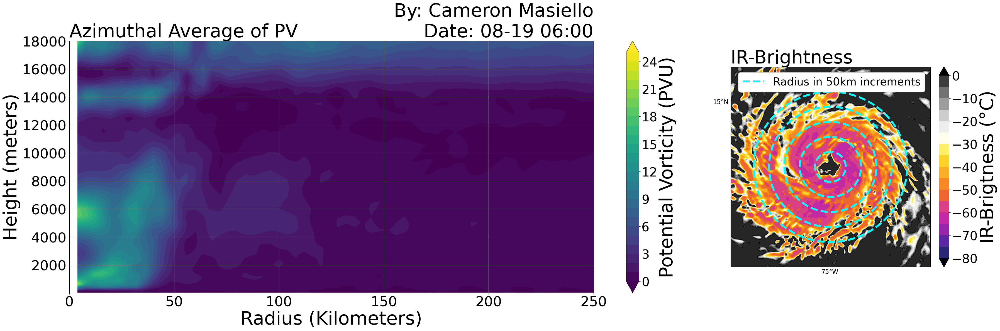

WRF valid time:  2007-08-19_09 2007-08-19 09:00 2007-08-19T09:00:00.000000000


/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:112: RuntimeWarning: Mean of empty slice
  pvazavg[k,bincnt] = np.nanmean(pvbin[:,:])
/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:113: RuntimeWarning: Mean of empty slice
  waazavg[k,bincnt] = np.nanmean(wabin[:,:])


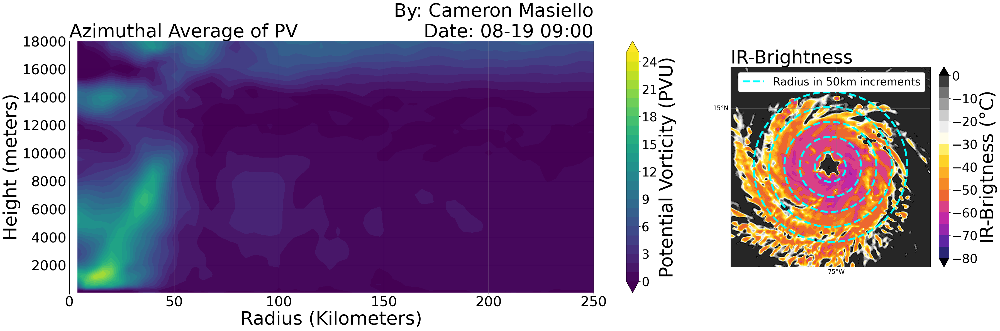

WRF valid time:  2007-08-19_12 2007-08-19 12:00 2007-08-19T12:00:00.000000000


/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:112: RuntimeWarning: Mean of empty slice
  pvazavg[k,bincnt] = np.nanmean(pvbin[:,:])
/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:113: RuntimeWarning: Mean of empty slice
  waazavg[k,bincnt] = np.nanmean(wabin[:,:])


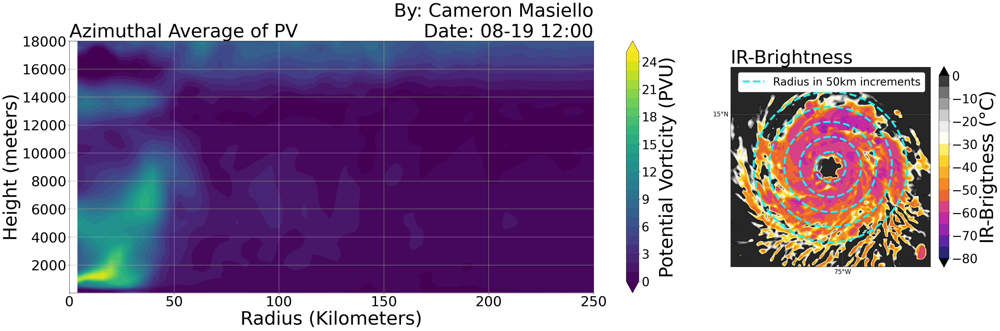

WRF valid time:  2007-08-19_15 2007-08-19 15:00 2007-08-19T15:00:00.000000000


/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:112: RuntimeWarning: Mean of empty slice
  pvazavg[k,bincnt] = np.nanmean(pvbin[:,:])
/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:113: RuntimeWarning: Mean of empty slice
  waazavg[k,bincnt] = np.nanmean(wabin[:,:])


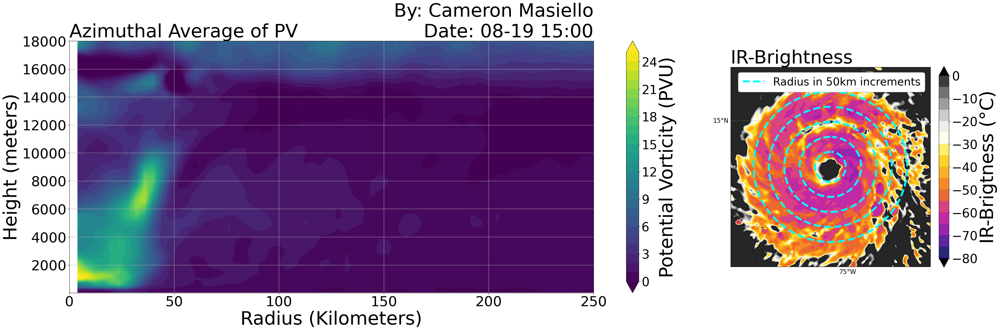

WRF valid time:  2007-08-19_18 2007-08-19 18:00 2007-08-19T18:00:00.000000000


/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:112: RuntimeWarning: Mean of empty slice
  pvazavg[k,bincnt] = np.nanmean(pvbin[:,:])
/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:113: RuntimeWarning: Mean of empty slice
  waazavg[k,bincnt] = np.nanmean(wabin[:,:])


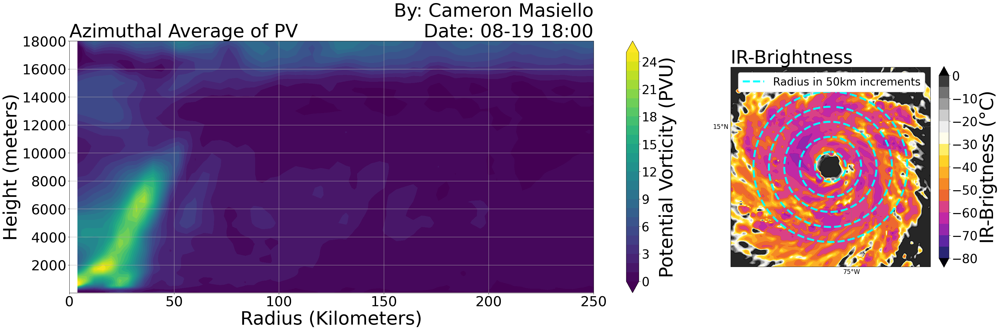

WRF valid time:  2007-08-19_21 2007-08-19 21:00 2007-08-19T21:00:00.000000000


/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:112: RuntimeWarning: Mean of empty slice
  pvazavg[k,bincnt] = np.nanmean(pvbin[:,:])
/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:113: RuntimeWarning: Mean of empty slice
  waazavg[k,bincnt] = np.nanmean(wabin[:,:])


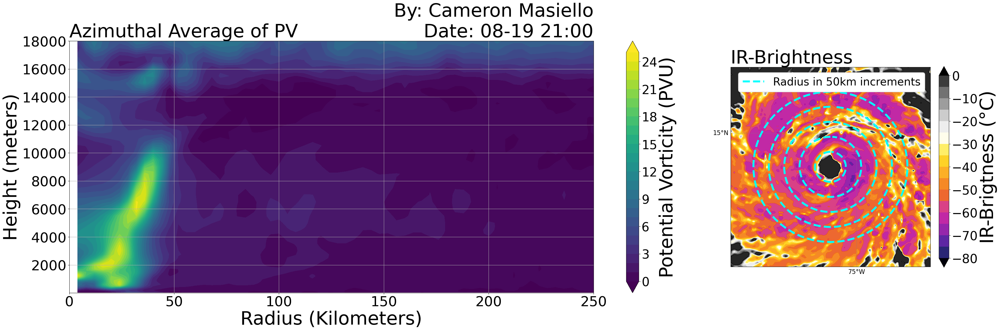

WRF valid time:  2007-08-20_00 2007-08-20 00:00 2007-08-20T00:00:00.000000000


/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:112: RuntimeWarning: Mean of empty slice
  pvazavg[k,bincnt] = np.nanmean(pvbin[:,:])
/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:113: RuntimeWarning: Mean of empty slice
  waazavg[k,bincnt] = np.nanmean(wabin[:,:])


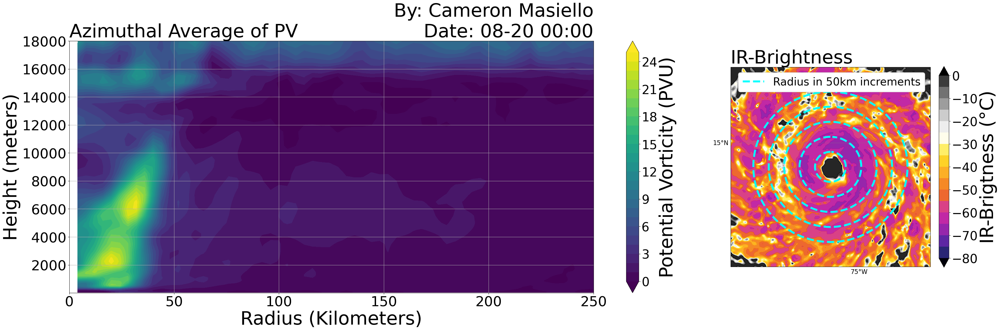

WRF valid time:  2007-08-20_03 2007-08-20 03:00 2007-08-20T03:00:00.000000000


/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:112: RuntimeWarning: Mean of empty slice
  pvazavg[k,bincnt] = np.nanmean(pvbin[:,:])
/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:113: RuntimeWarning: Mean of empty slice
  waazavg[k,bincnt] = np.nanmean(wabin[:,:])


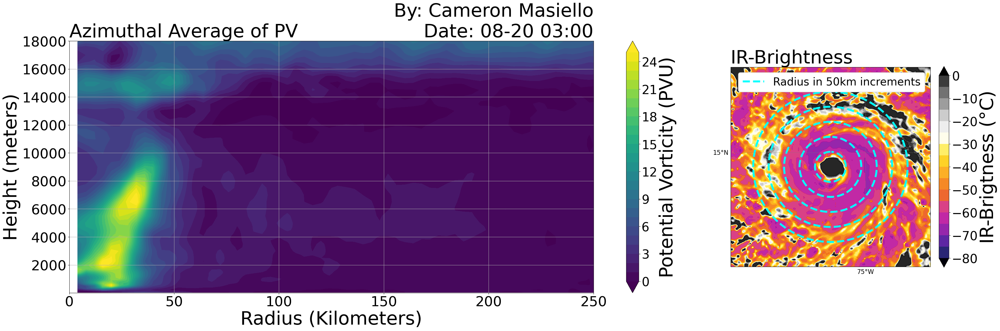

WRF valid time:  2007-08-20_06 2007-08-20 06:00 2007-08-20T06:00:00.000000000


/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:112: RuntimeWarning: Mean of empty slice
  pvazavg[k,bincnt] = np.nanmean(pvbin[:,:])
/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:113: RuntimeWarning: Mean of empty slice
  waazavg[k,bincnt] = np.nanmean(wabin[:,:])


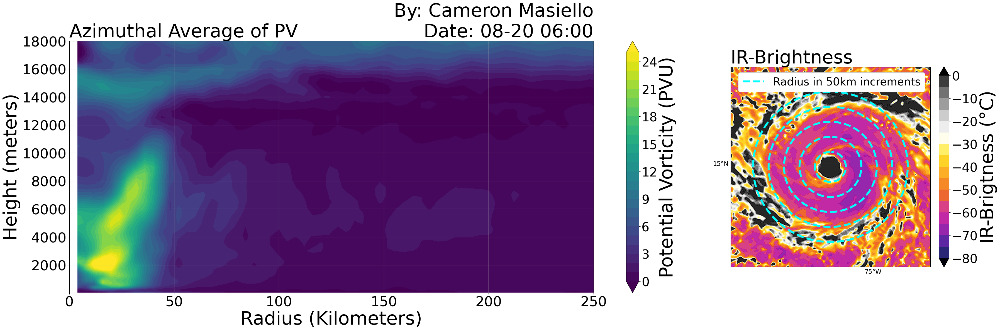

WRF valid time:  2007-08-20_09 2007-08-20 09:00 2007-08-20T09:00:00.000000000


/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:112: RuntimeWarning: Mean of empty slice
  pvazavg[k,bincnt] = np.nanmean(pvbin[:,:])
/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:113: RuntimeWarning: Mean of empty slice
  waazavg[k,bincnt] = np.nanmean(wabin[:,:])


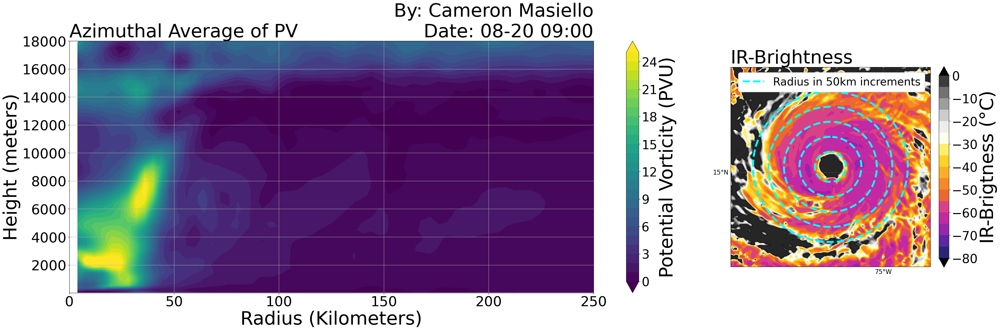

WRF valid time:  2007-08-20_12 2007-08-20 12:00 2007-08-20T12:00:00.000000000


/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:112: RuntimeWarning: Mean of empty slice
  pvazavg[k,bincnt] = np.nanmean(pvbin[:,:])
/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:113: RuntimeWarning: Mean of empty slice
  waazavg[k,bincnt] = np.nanmean(wabin[:,:])


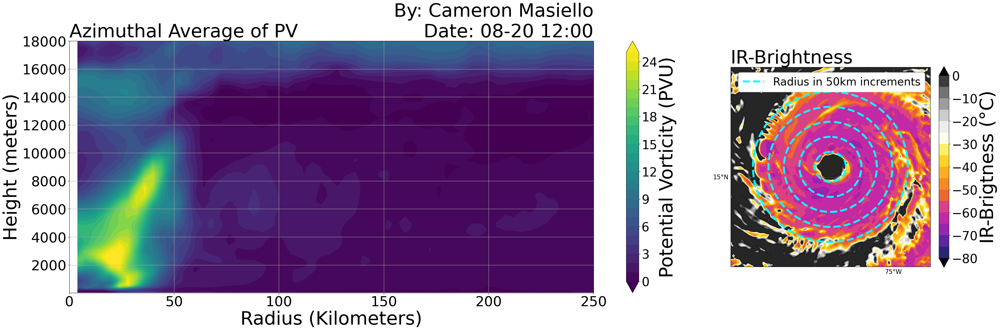

WRF valid time:  2007-08-20_15 2007-08-20 15:00 2007-08-20T15:00:00.000000000


/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:112: RuntimeWarning: Mean of empty slice
  pvazavg[k,bincnt] = np.nanmean(pvbin[:,:])
/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:113: RuntimeWarning: Mean of empty slice
  waazavg[k,bincnt] = np.nanmean(wabin[:,:])


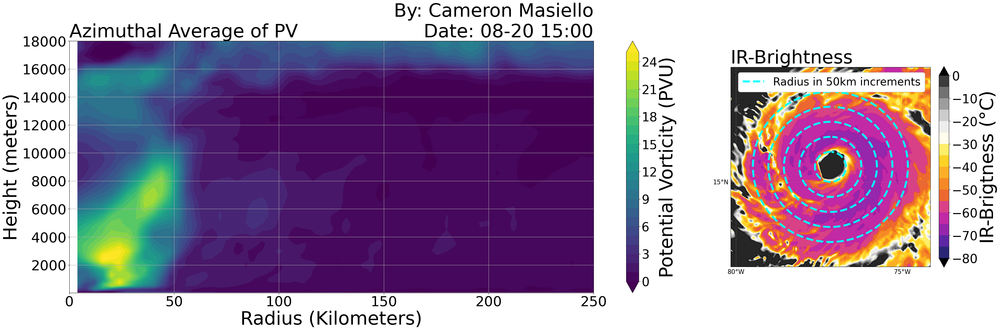

WRF valid time:  2007-08-20_18 2007-08-20 18:00 2007-08-20T18:00:00.000000000


/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:112: RuntimeWarning: Mean of empty slice
  pvazavg[k,bincnt] = np.nanmean(pvbin[:,:])
/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:113: RuntimeWarning: Mean of empty slice
  waazavg[k,bincnt] = np.nanmean(wabin[:,:])


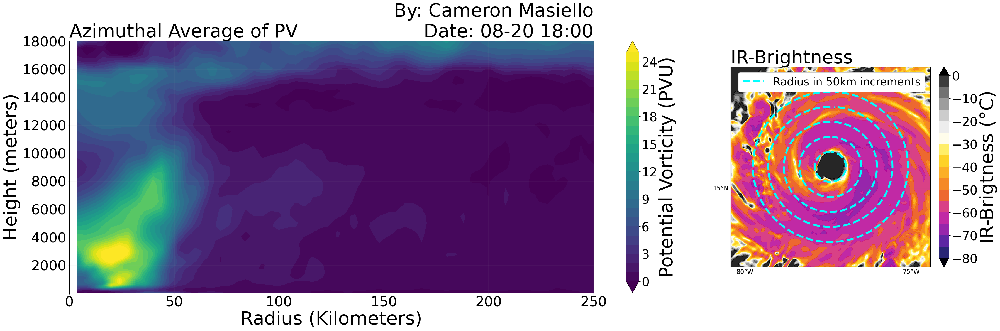

WRF valid time:  2007-08-20_21 2007-08-20 21:00 2007-08-20T21:00:00.000000000


/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:112: RuntimeWarning: Mean of empty slice
  pvazavg[k,bincnt] = np.nanmean(pvbin[:,:])
/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:113: RuntimeWarning: Mean of empty slice
  waazavg[k,bincnt] = np.nanmean(wabin[:,:])


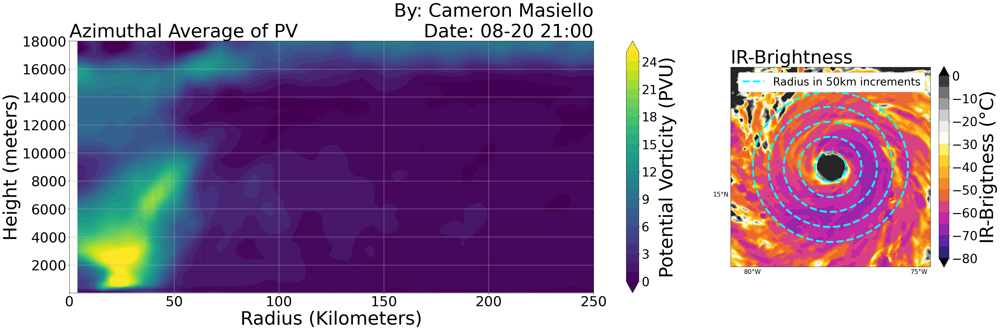

WRF valid time:  2007-08-21_00 2007-08-21 00:00 2007-08-21T00:00:00.000000000


/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:112: RuntimeWarning: Mean of empty slice
  pvazavg[k,bincnt] = np.nanmean(pvbin[:,:])
/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:113: RuntimeWarning: Mean of empty slice
  waazavg[k,bincnt] = np.nanmean(wabin[:,:])


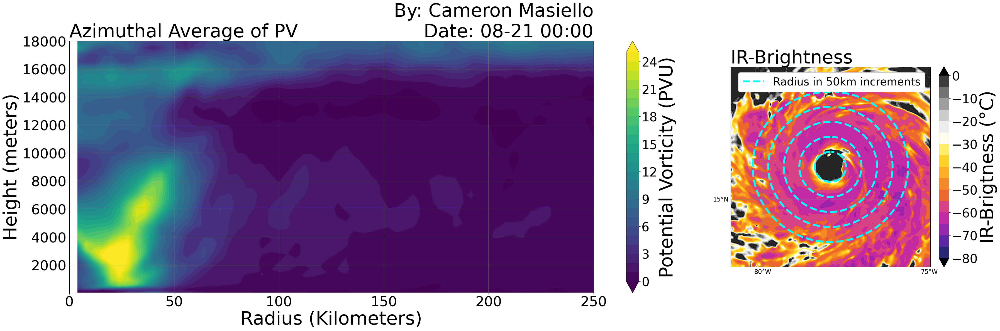

WRF valid time:  2007-08-21_03 2007-08-21 03:00 2007-08-21T03:00:00.000000000


/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:112: RuntimeWarning: Mean of empty slice
  pvazavg[k,bincnt] = np.nanmean(pvbin[:,:])
/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:113: RuntimeWarning: Mean of empty slice
  waazavg[k,bincnt] = np.nanmean(wabin[:,:])


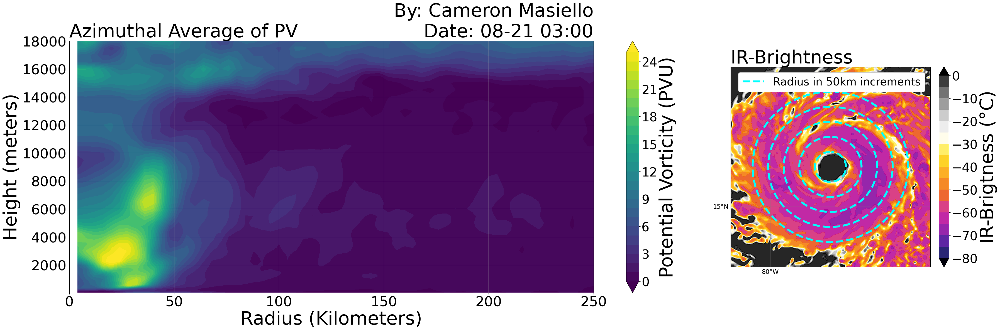

WRF valid time:  2007-08-21_06 2007-08-21 06:00 2007-08-21T06:00:00.000000000


/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:112: RuntimeWarning: Mean of empty slice
  pvazavg[k,bincnt] = np.nanmean(pvbin[:,:])
/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:113: RuntimeWarning: Mean of empty slice
  waazavg[k,bincnt] = np.nanmean(wabin[:,:])


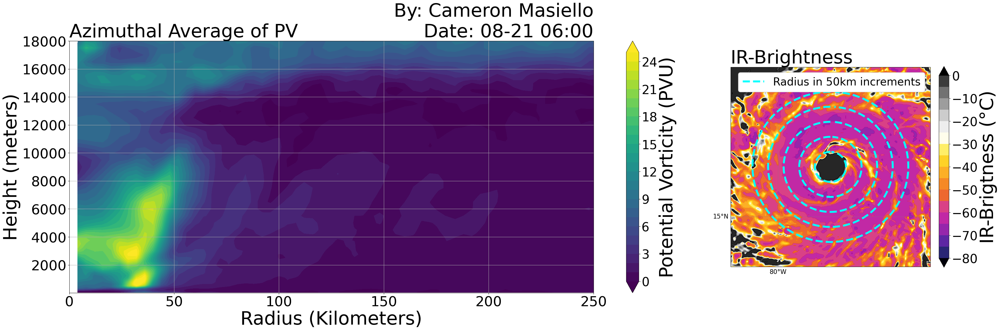

WRF valid time:  2007-08-21_09 2007-08-21 09:00 2007-08-21T09:00:00.000000000


/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:112: RuntimeWarning: Mean of empty slice
  pvazavg[k,bincnt] = np.nanmean(pvbin[:,:])
/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:113: RuntimeWarning: Mean of empty slice
  waazavg[k,bincnt] = np.nanmean(wabin[:,:])


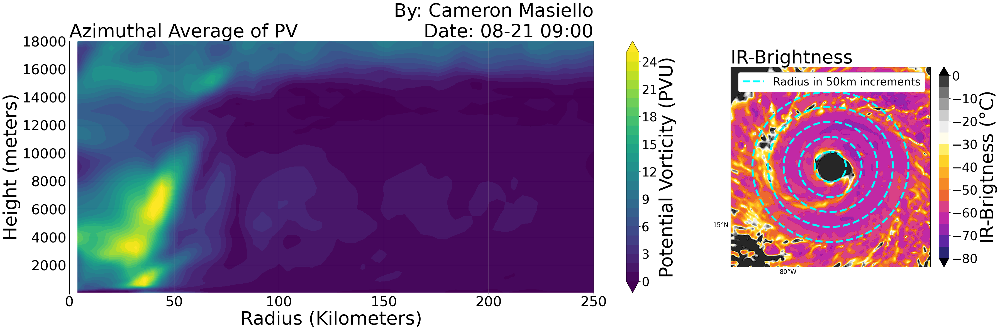

WRF valid time:  2007-08-21_12 2007-08-21 12:00 2007-08-21T12:00:00.000000000


/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:112: RuntimeWarning: Mean of empty slice
  pvazavg[k,bincnt] = np.nanmean(pvbin[:,:])
/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:113: RuntimeWarning: Mean of empty slice
  waazavg[k,bincnt] = np.nanmean(wabin[:,:])


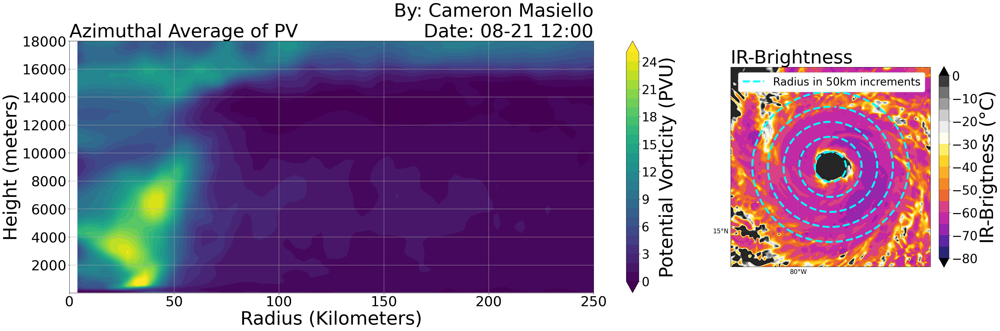

WRF valid time:  2007-08-21_15 2007-08-21 15:00 2007-08-21T15:00:00.000000000


/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:112: RuntimeWarning: Mean of empty slice
  pvazavg[k,bincnt] = np.nanmean(pvbin[:,:])
/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/1495773892.py:113: RuntimeWarning: Mean of empty slice
  waazavg[k,bincnt] = np.nanmean(wabin[:,:])


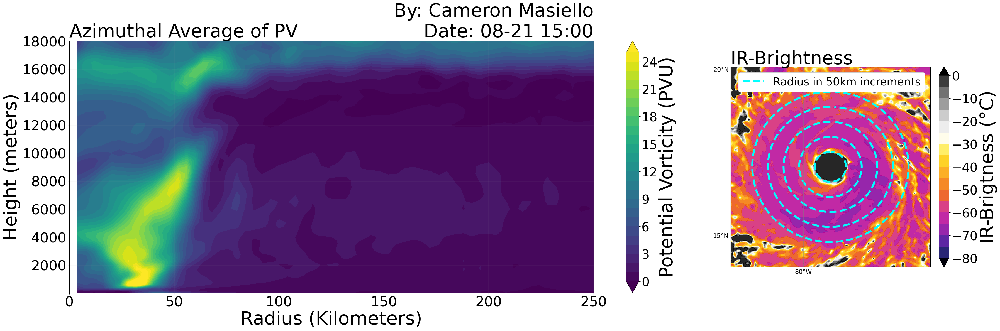

In [42]:
for item in range(10,30):
    ncfile = Dataset(data_files[item])
    wrf_out_data = xr.open_dataset(data_files[item])
    
    Time = wrf.extract_times(ncfile, timeidx=0, method='cat', squeeze=True, cache=None, meta=False, do_xtime=False)
    timestr=(str(Time))
    
    # Set up one time string for plot titles, another for file names
    titletime=(timestr[0:10]+' '+timestr[11:16])
    filetime=(timestr[0:10]+'_'+timestr[11:13])
    print('WRF valid time: ',filetime, titletime, timestr)
    
    #Get constant variables
    lats = getvar(ncfile, "XLAT")
    lons = getvar(ncfile, "XLONG")
    nx, ny = lats.shape
    
    ###############################################################################################
    #Next, isolate the variable we care to look at, in this case we will only care about the pressure pertubations
    P_pertubation = wrf_out_data['P']
    surface_P_pertubation = P_pertubation[0,0,:,:]
    
    #Apply a Gaussian filter to smooth the pressure field
    smoothed_pressure = gaussian_filter(surface_P_pertubation, sigma=10)  # Adjust sigma as necessary

    #Now find the minimum pressure in the smoothed field
    minpressure_smoothed = np.min(smoothed_pressure)
    
    #print(minpressure_smoothed)
    minp_smoothed = minpressure_smoothed

    # Get the index of the minimum pressure
    p_index_smoothed = np.argwhere(smoothed_pressure == minp_smoothed)
    s_n_smoothed = p_index_smoothed[0][0]
    w_e_smoothed = p_index_smoothed[0][1]

    # Update the storm center position
    ypos = s_n_smoothed
    xpos = w_e_smoothed

    tc_lon = wrf_out_data['XLONG'][0,s_n_smoothed,w_e_smoothed].values
    tc_lat = wrf_out_data['XLAT'][0,s_n_smoothed,w_e_smoothed].values
    ##############################################################################################
    #IR brightness temperature
    wrf_out_OLR =  wrf_out_data['OLR'][0,:,:]
    
    wrf_out_OLR_T = -273.15 + (wrf_out_OLR.values + 310)/2
    ##############################################################################################
    #Initialize subset arrays with zero values. Start with field variables, then diagnostics
    wgrd, pvor = [np.zeros([nx,ny,n_zlevs]) for _ in range(2)]  #Range is just the number of variables specified to the left
    
    #Get variables 
    z_height = getvar(ncfile, "z")
    p = getvar(ncfile, "pressure")
    #slp = getvar(ncfile, "slp")
    #tk = getvar(ncfile, "tk")
    #ua = getvar(ncfile, "ua")
    #va = getvar(ncfile, "va")
    #rh = getvar(ncfile, "rh")
    wa  = getvar(ncfile, "wa")
    pvo = getvar(ncfile, "pvo")
    #rainc = getvar(ncfile, "RAINC")
    #rainnc = getvar(ncfile, "RAINNC")
    #psfc = getvar(ncfile, "PSFC")
    
    for k in range(n_zlevs):
        clev = zlevs[k]
        #yplabs[k] = clev
        ##print('interpolating to: ',clev)
        
        # Do vertical interpolation to specified vertical surfaces (in m)
        wap = interplevel(wa, z_height, clev)
        pvp = interplevel(pvo, z_height, clev)
    
        wgrd[:,:,k]  = wap[:,:]
        pvor[:,:,k]  = pvp[:,:]
    
    #Azimuthal average by binning.  Need to specify grid point of storm center, and have arrays for lat, lon
    #Could also set up to specify lat/lon of storm center
    binnum  = 125 #this lets us look at 500 kilometers away from the TC center
    binsize = 1
    dx      = 4000.   #Horizontal grid size of our domain
    
    ydist, xdist, tcdist, rlonfac   = [np.zeros([nx,ny]) for _ in range(4)]
    pvbin, wabin                    = [np.zeros([nx,ny]) for _ in range(2)]
    
    xlabs = ['']*binnum
    
    pvazavg, waazavg= [np.zeros([n_zlevs-1,int(binnum/binsize)]) for _ in range(2)]

    #define storm center
    ypos = s_n_smoothed
    xpos = w_e_smoothed

    #compute distance from each grid point to storm center
    rlonfac[:,:] = 111000.*cos(d2r*lats[:,:])
    ydist[:,:]   = (lats[:,:] - lats[ypos,xpos])*111000
    xdist[:,:]   = (lons[:,:] - (lons[ypos,xpos]))*rlonfac
    tcdist[:,:]  = (xdist[:,:]**2 + ydist[:,:]**2)**0.5
    
    for j in range (0, binnum, binsize):
        binmin = j*dx
        binmax = (j+binsize)*dx
        bincnt = int(j/binsize)
        
        xlabs[j] = str(bincnt*12)
        for k in range (1, n_zlevs-1):
            pvbin[:,:] = np.where(((tcdist[:,:] > binmin) & (tcdist[:,:] < binmax)), pvor[:,:,k], nan)
            wabin[:,:] = np.where(((tcdist[:,:] > binmin) & (tcdist[:,:] < binmax)), wgrd[:,:,k], nan)
            
            pvazavg[k,bincnt] = np.nanmean(pvbin[:,:])
            waazavg[k,bincnt] = np.nanmean(wabin[:,:])
    
    ######################################################################################################
    #now we will plot these azimuthal averages

    radial = np.arange(0,binnum) * 4
    vertical = zlevs[:n_zlevs-1]

    #Plotting
    fig = plt.figure(figsize=(36, 12))

    gs = GridSpec(1, 2, width_ratios=[3, 1], figure=fig)

    #Momentum plot
    ax1 = fig.add_subplot(gs[0])
    contourf1 = ax1.contourf(radial, vertical, pvazavg, 
                             levels=np.arange(0, 26, 1), 
                             cmap='viridis', 
                             extend='both')

    #Adding a colorbar for momentum
    cbar1 = fig.colorbar(contourf1, ax=ax1)
    cbar1.set_label(r'Potential Vorticity (PVU)', fontsize=48)
    cbar1.ax.tick_params(labelsize=32)
    cbar1.ax.yaxis.get_offset_text().set(size=32)

    #Set axis labels for momentum plot
    ax1.invert_yaxis()
    ax1.set_xlabel('Radius (Kilometers)', fontsize=48)
    ax1.set_ylabel('Height (meters)', fontsize=48)

    #Set tick size for momentum plot
    ax1.tick_params(axis='both', which='major', labelsize=36)
    ax1.tick_params(axis='both', which='minor', labelsize=32)

    #invert axis so 0 meters is on the bottom!
    ax1.invert_yaxis()

    ax1.grid(True)

    ax1.set_xlim(0,250)

    #Title for momentum plot
    ax1.set_title(f'Azimuthal Average of PV ', loc='left', fontsize=48)
    ax1.set_title(f'By: Cameron Masiello\nDate: {titletime[5:]}', loc='right', fontsize=48)

    #IR brightness plot
    ax2 = fig.add_subplot(gs[1], projection=ccrs.PlateCarree())
    create_map_background(tc_lon, tc_lat, ax=ax2)
    contourf2 = ax2.contourf(lons, lats, wrf_out_OLR_T, 
                             origin='lower', 
                             cmap=newcmp, 
                             levels=np.arange(-80, 5, 5), 
                             alpha=.85, 
                             extend='both')

    #Adding a colorbar for IR brightness
    cbar2 = fig.colorbar(contourf2, ax=ax2, fraction=0.046, pad=0.04)
    cbar2.set_label(r'IR-Brigtness (°C)', fontsize=48)
    cbar2.ax.tick_params(labelsize=32)

    #Set axis labels for IR brightness plot
    ax2.set_xlabel('Longitude (°W)', fontsize=48)
    ax2.set_ylabel('Latitude (°N)', fontsize=48)

    #Set tick size for IR brightness plot
    ax2.tick_params(axis='both', which='major', labelsize=36)
    ax2.tick_params(axis='both', which='minor', labelsize=32)

    #Title for IR brightness plot
    ax2.set_title(f'IR-Brightness', loc='left', fontsize = 48)
    #ax2.set_title(f'Date: {titletime[5:]}', loc='right', fontsize = 32)

    #Now, add circles at regular intervals of 50 km!
    radius_km_1 = 50   #Specify this radius for what ever radius you want 
    radius_km_2 = 100   #Specify this radius for what ever radius you want 
    radius_km_3 = 150   #Specify this radius for what ever radius you want 
    radius_km_4 = 200   #Specify this radius for what ever radius you want 
    radius_km_5 = 250   #Specify this radius for what ever radius you want 

    #Define the geodetic circle
    geodetic = Geodesic()
    circle_points_1 = geodetic.circle(lon=tc_lon, lat=tc_lat, radius=radius_km_1 * 1000, n_samples=100)
    circle_points_2 = geodetic.circle(lon=tc_lon, lat=tc_lat, radius=radius_km_2 * 1000, n_samples=100)
    circle_points_3 = geodetic.circle(lon=tc_lon, lat=tc_lat, radius=radius_km_3 * 1000, n_samples=100)
    circle_points_4 = geodetic.circle(lon=tc_lon, lat=tc_lat, radius=radius_km_4 * 1000, n_samples=100)
    circle_points_5 = geodetic.circle(lon=tc_lon, lat=tc_lat, radius=radius_km_5 * 1000, n_samples=100)

    #Plot the circle on the map
    ax2.plot(circle_points_1[:, 0], circle_points_1[:, 1], transform=ccrs.Geodetic(), 
            color='cyan', 
            linestyle='--',
            linewidth=5)

    ax2.plot(circle_points_2[:, 0], circle_points_2[:, 1], transform=ccrs.Geodetic(), 
            color='cyan', 
            linestyle='--',
            linewidth=5)

    ax2.plot(circle_points_3[:, 0], circle_points_3[:, 1], transform=ccrs.Geodetic(), 
            color='cyan', 
            linestyle='--',
            linewidth=5)

    ax2.plot(circle_points_4[:, 0], circle_points_4[:, 1], transform=ccrs.Geodetic(), 
            color='cyan', 
            linestyle='--',
            linewidth=5)

    ax2.plot(circle_points_5[:, 0], circle_points_5[:, 1], transform=ccrs.Geodetic(), 
            color='cyan', 
            linestyle='--',
            linewidth=5, label = 'Radius in 50km increments')

    #Add legend for IR brightness plot
    ax2.legend(loc='upper right', fontsize=28, framealpha=1)

    #Adjust layout and show plot
    plt.tight_layout()
    
    #Save Figure now:
    output_dir =   '/Users/cjmasiel/Desktop/Cross_Section/PV/'
    output_path = f'/Users/cjmasiel/Desktop/Cross_Section/PV/{filetime}.png'
    
    plt.savefig(output_path, bbox_inches='tight')
    plt.show()

In [43]:
#Now, Create a GIF!
import imageio
import glob

images = []
all_imgs = sorted(glob.glob("/Users/cjmasiel/Desktop/Cross_Section/PV/*.png"))

for i in range(len(all_imgs)):
     images.append(imageio.imread(all_imgs[i]))

imageio.mimsave('/Users/cjmasiel/Desktop/Cross_Section/PV/PV.gif', images, duration=.4,loop=0)

/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_13717/2182116465.py:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(all_imgs[i]))
